In [ ]:
g!pip install netCDF4 xarray numpy cartopy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.3/9.3 MB 24.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 21.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 22.0 MB/s eta 0:00:00


In [ ]:
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
from scipy.stats import linregress

In [ ]:
# 'Mount' google drive - this makes all files of google drive available to load
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
ds = xr.open_dataset('/content/drive/MyDrive/AI Fellowship Data/data.nc', engine='netcdf4')
ds['ws10'] = np.sqrt((ds['u10']**2 + ds['v10']**2))
ds


<xarray.Dataset> Size: 132MB
Dimensions:    (longitude: 14, latitude: 14, time: 7669)
Coordinates:
  * longitude  (longitude) float32 56B -124.0 -123.2 -122.5 ... -115.0 -114.2
  * latitude   (latitude) float32 56B 41.75 41.0 40.25 39.5 ... 33.5 32.75 32.0
  * time       (time) datetime64[ns] 61kB 2003-01-01 2003-01-02 ... 2023-12-30
Data variables:
    u10        (time, latitude, longitude) float64 12MB 1.46 1.114 ... -0.4466
    v10        (time, latitude, longitude) float64 12MB 3.406 1.864 ... -2.046
    t2m        (time, latitude, longitude) float64 12MB ...
    msl        (time, latitude, longitude) float64 12MB ...
    pm2p5      (time, latitude, longitude) float64 12MB ...
    tcco       (time, latitude, longitude) float64 12MB ...
    tc_ch4     (time, latitude, longitude) float64 12MB ...
    tcno2      (time, latitude, longitude) float64 12MB ...
    gtco3      (time, latitude, longitude) float64 12MB ...
    tcwv       (time, latitude, longitude) float64 12MB ...
    ws10       (time, latitude, longitude) float64 12MB 3.706 2.171 ... 2.094
Attributes:
    Conventions:  CF-1.6
    history:      2024-08-13 16:19:08 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

In [ ]:
def plot_map(datapoint, label, save_name, levels=None, cmap="coolwarm", winds=None, psl=None, coa=None):
  # Set up the plot with a global projection
  fig = plt.figure(figsize=(12, 6))
  ax = plt.axes(projection=ccrs.PlateCarree())

  if levels is None:
    min_lev = np.nanmin(datapoint)
    max_lev = np.nanmax(datapoint)
    step_lev = (max_lev - min_lev) / 10
    levels = np.arange(min_lev, max_lev, step_lev)

  # Plot the data using contourf
  contour = ax.contourf(
      datapoint.longitude,
      datapoint.latitude,
      datapoint,
      levels=levels,
      transform=ccrs.PlateCarree(),
      cmap=cmap,
      extend='both',
    )




  if winds is not None:
      # quiver([X, Y], U, V, [C], **kwargs)
      q = ax.quiver(datapoint.longitude, datapoint.latitude, winds["U10"], winds["V10"], transform=ccrs.PlateCarree())
      # Add quiver key
      ax.quiverkey(q, .7, -.15, 1, str(1) + r' $\frac{m}{s}/\sigma$', labelpos='E', transform=ccrs.PlateCarree(), coordinates='axes')

  if psl is not None:
    x = ax.contour(
          datapoint.longitude, datapoint.latitude, psl, levels=10, colors="black", transform=ccrs.PlateCarree()
        )

  if coa is not None:
    # Add point at coa
    ax.plot(coa[1], coa[0], marker='*', color='yellow', markersize=12, transform=ccrs.PlateCarree())


  # Add coastlines and gridlines
  ax.coastlines()
  ax.gridlines(draw_labels=True)

  # Add a colorbar
  cbar = plt.colorbar(contour, ax=ax, orientation='vertical', shrink=1.0, pad=0.05)
  cbar.set_label(label)

  # Add additional features (optional)
  ax.add_feature(cfeature.BORDERS, linestyle=':')
  ax.add_feature(cfeature.OCEAN, facecolor='lightgray', zorder=100)

    ## TODO: Add star for the latitude/longitude for composites (add lat/lon into arguments of function)


  # Show the plot
  if (save_name != ''):
    plt.savefig("/content/drive/MyDrive/" + save_name, dpi=300)

  plt.show()


# call function
#plot_map(t2m, '2m Temperature (K)', '2mtemp.png', winds={"U10": ds["u10"], "V10": ds["v10"]}, psl=ds["psl"])

In [ ]:
def calculate_anomalies(ds):

  # Group by year (time.year) and calculate the mean for each year
  grouped_mean = ds.groupby("time.dayofyear").mean("time")


  # Calculate anomalies by subtracting the yearly mean from each time point
  ds_anoms = ds.groupby("time.dayofyear") - grouped_mean


  return ds_anoms

ds_anoms_t2m = calculate_anomalies(ds['t2m']).to_dataset()
ds_anoms_tcwv = calculate_anomalies(ds['tcwv']).to_dataset()
ds_anoms_pm2p5 = calculate_anomalies(ds['pm2p5']).to_dataset()
# ds_extreme_heat = ds_anoms["t2m"].quantile(0.95, dim='time')



In [ ]:
def find_extreme_values(ds, qt, value, lat, lon):

  ds_extreme = ds[value].quantile(qt, dim='time')


  ds_big_vals = ds[value].where(ds[value] > ds_extreme, np.nan)


  ds_big_vals = ds_big_vals.sel(latitude=lat, longitude=lon, method='nearest')

  times = []
  for time in ds_big_vals.time:
    if not (np.isnan(ds_big_vals.sel(time=time).values)):
      times.append(time.values)

  return ds_big_vals.sel(time=times), times

#38.58071410477496, -121.4987360340049 (sacramento)
#34.054995716916494, -118.24526276282197 (los angeles)
latitude,longitude= 38.58071410477496, -121.4987360340049
city = 'Sacramento'

heat_waves, heat_times = find_extreme_values(ds_anoms_t2m.sel(time=ds['time'].dt.month.isin([5,6,7,8,9])), 0.95, 't2m', latitude, longitude)
max_tcwv, tcwv_times = find_extreme_values(ds_anoms_tcwv.sel(time=ds['time'].dt.month.isin([5,6,7,8,9])), 0.90, 'tcwv', latitude, longitude)
max_polluted, polluted_times = find_extreme_values(ds_anoms_pm2p5.sel(time=ds['time'].dt.month.isin([5,6,7,8,9])), 0.90, 'pm2p5', latitude, longitude)

hot_and_humid = np.intersect1d(heat_times, tcwv_times) # most hot and humid times

hot_and_polluted = np.intersect1d(heat_times, polluted_times) # most hot and polluted times
hot_and_polluted

array(['2003-05-24T00:00:00.000000000', '2008-05-20T00:00:00.000000000',
       '2008-07-09T00:00:00.000000000', '2008-07-10T00:00:00.000000000',
       '2013-05-04T00:00:00.000000000', '2017-09-02T00:00:00.000000000',
       '2017-09-03T00:00:00.000000000', '2017-09-04T00:00:00.000000000',
       '2020-08-19T00:00:00.000000000', '2020-09-07T00:00:00.000000000',
       '2020-09-08T00:00:00.000000000', '2020-09-29T00:00:00.000000000',
       '2022-09-10T00:00:00.000000000'], dtype='datetime64[ns]')

In [ ]:
def get_composites(heat_times, tcwv_times, var='gtco3'):
  heat_dry_times = np.setdiff1d(heat_times, tcwv_times)
  ds_anoms = calculate_anomalies(ds[var]).to_dataset()
  ds_var_hot = ds_anoms[var].sel(time=heat_dry_times)
  ds_var_hot_avg = ds_var_hot.mean("time")

  hot_and_humid = np.intersect1d(heat_times, tcwv_times)
  ds_var_hot_and_humid = ds_anoms[var].sel(time=hot_and_humid)
  ds_var_hot_and_humid_avg = ds_var_hot_and_humid.mean("time")

  # Difference
  ds_var_diff = ds_var_hot_and_humid_avg - ds_var_hot_avg

  return ds_var_hot_avg, ds_var_hot_and_humid_avg, ds_var_diff

In [ ]:
def get_heatwaves(heat_times, tcwv_times, var='gtco3'):
  heat_dry_times = np.setdiff1d(heat_times, tcwv_times)
  ds_anoms = calculate_anomalies(ds[var]).to_dataset()
  ds_var_hot = ds_anoms[var].sel(time=heat_dry_times)

  hot_and_humid = np.intersect1d(heat_times, tcwv_times)
  ds_var_hot_and_humid = ds_anoms[var].sel(time=hot_and_humid)

  # Difference
  ds_var_diff = ds_var_hot_and_humid - ds_var_hot

  return ds_var_hot, ds_var_hot_and_humid, ds_var_diff


#Heat Wave Time Series
Note to self: change base date to choose which heatwave we want to look at
Repeat analysis for several heatwaves and all meteorological variables

In [ ]:
for i in range(len(heat_times)):
  print(i, heat_times[i])


0 2003-05-23T00:00:00.000000000
1 2003-05-24T00:00:00.000000000
2 2003-05-28T00:00:00.000000000
3 2003-05-29T00:00:00.000000000
4 2003-09-21T00:00:00.000000000
5 2003-09-22T00:00:00.000000000
6 2003-09-23T00:00:00.000000000
7 2004-05-03T00:00:00.000000000
8 2004-05-04T00:00:00.000000000
9 2005-07-18T00:00:00.000000000
10 2005-08-07T00:00:00.000000000
11 2006-05-15T00:00:00.000000000
12 2006-05-16T00:00:00.000000000
13 2006-06-24T00:00:00.000000000
14 2006-06-26T00:00:00.000000000
15 2006-07-23T00:00:00.000000000
16 2006-07-24T00:00:00.000000000
17 2007-05-07T00:00:00.000000000
18 2007-05-08T00:00:00.000000000
19 2007-05-09T00:00:00.000000000
20 2007-06-14T00:00:00.000000000
21 2007-06-15T00:00:00.000000000
22 2007-07-05T00:00:00.000000000
23 2007-07-06T00:00:00.000000000
24 2008-05-15T00:00:00.000000000
25 2008-05-16T00:00:00.000000000
26 2008-05-17T00:00:00.000000000
27 2008-05-18T00:00:00.000000000
28 2008-05-19T00:00:00.000000000
29 2008-05-20T00:00:00.000000000
30 2008-06-10T00:00:

1
[-0.92758842 -0.43783273 -3.20924619 -3.76899607 -0.76006051 -1.38369599
 -2.05304404  1.82198686  4.2445493   6.1851445   7.62167974  6.90748451
 -2.03899429 -0.89032606  1.55030761  7.00822523  8.50340287 -0.12237529
 -1.0896186   1.56216844  4.20947585]
[ 1.81872440e-09  3.82006969e-09  5.82440877e-09  8.40954214e-09
  6.45759430e-09 -4.01466572e-09  1.31127784e-09 -1.80525237e-09
  2.58363648e-09  9.75973918e-10  2.57166134e-09  7.47847499e-09
  1.07117628e-08  6.43364402e-09  1.99086704e-09 -2.19743821e-09
  5.15380092e-09  1.62098490e-08 -1.39211004e-09  6.16120958e-09
 -5.41126643e-09]
LinregressResult(slope=-3.2119732385542446e-10, intercept=3.984268689714683e-09, rvalue=-0.2413468677728666, pvalue=0.2919065935478368, stderr=2.962931797925161e-10, intercept_stderr=1.2058011133785413e-09)
2
[-0.43783273 -3.20924619 -3.76899607 -0.76006051 -1.38369599 -2.05304404
  1.82198686  4.2445493   6.1851445   7.62167974  6.90748451 -2.03899429
 -0.89032606  1.55030761  7.00822523  8.503

<ipython-input-10-3e31bda96bd7>:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots()


[-2.22550971 -5.73550184 -4.66090018 -1.40624685  0.165339    3.55947165
  0.8321418   3.45582935  5.08641393  7.33050392  7.21143744  6.79452661
 -1.08030301  3.86907503  5.91046185 -0.13301441 -3.59739578  0.22754474
 -0.01868208 -1.05474877 -1.63674407]
[ 6.36029629e-09 -4.86490067e-10 -3.59254203e-10 -4.52959674e-09
 -3.35303923e-09  1.33522812e-09 -8.09818849e-10 -1.82920265e-09
 -3.89042364e-09 -3.32310138e-09 -4.23919960e-09 -5.85284972e-10
 -1.75735181e-09  2.50579807e-09  1.44150749e-09  4.13591401e-09
  8.90052288e-09 -1.49689251e-12  8.43199552e-09 -5.82590566e-09
 -3.82006969e-09]
LinregressResult(slope=-2.7042706890933475e-10, intercept=2.1390965806269707e-10, rvalue=-0.25346444927567646, pvalue=0.26759275231794716, stderr=2.3677593698292995e-10, intercept_stderr=9.422061154126216e-10)
23
[-1.63674407  2.89093809  1.48484395 -0.2909722  -3.74909227 -4.92005684
 -3.86688612 -2.59502812  0.17516363  3.8111453   8.16340929  9.3776939
  4.84227421 -0.57726115  2.86711461 -0.90

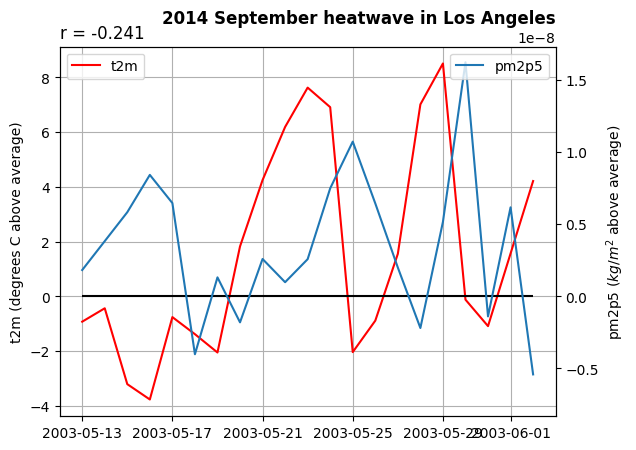

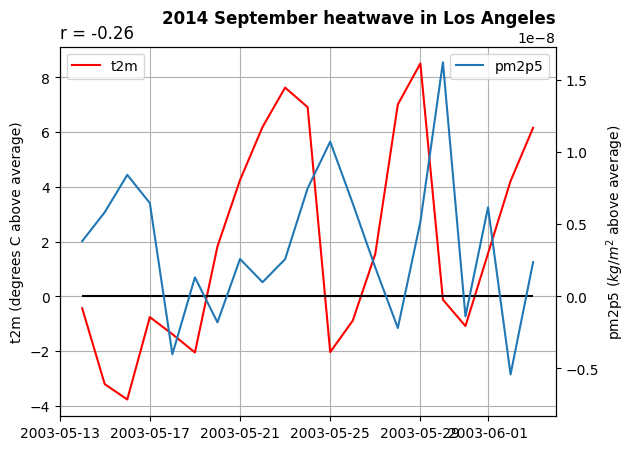

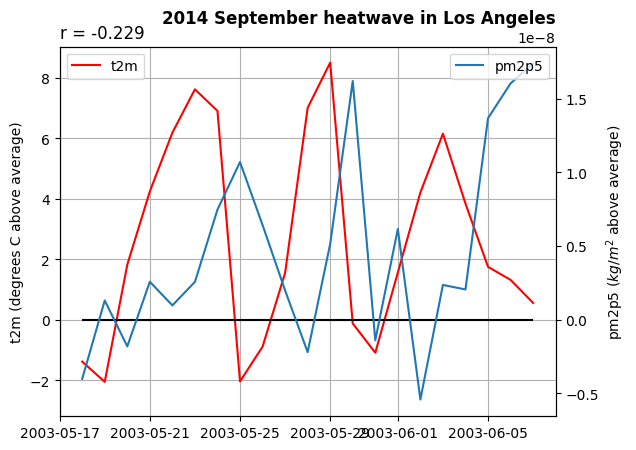

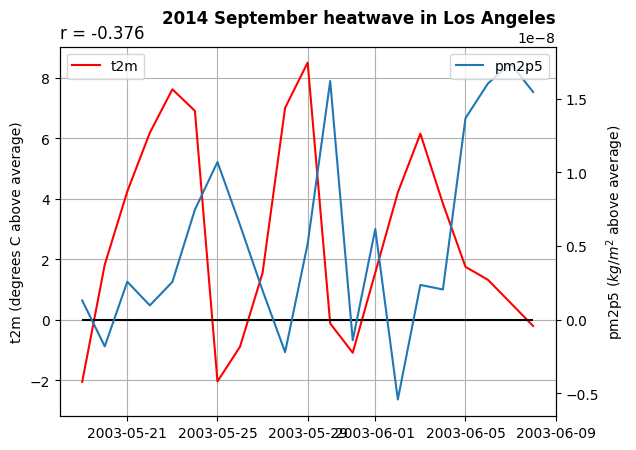

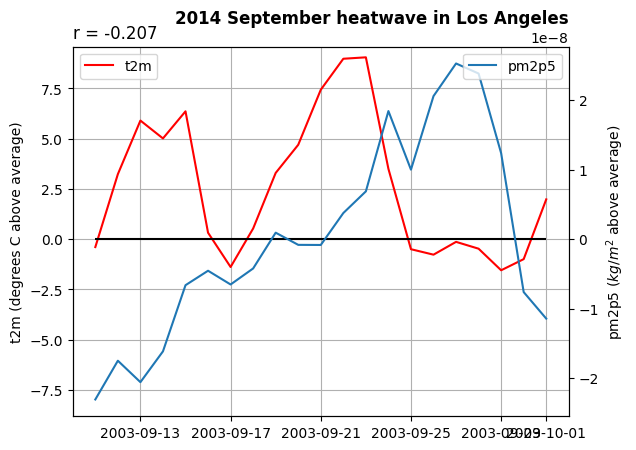

...

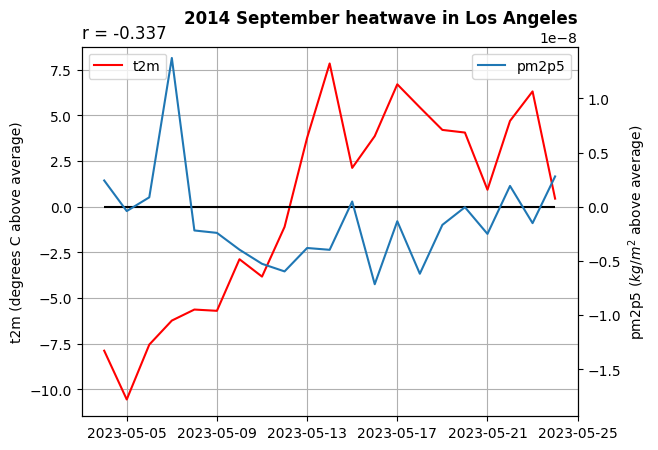

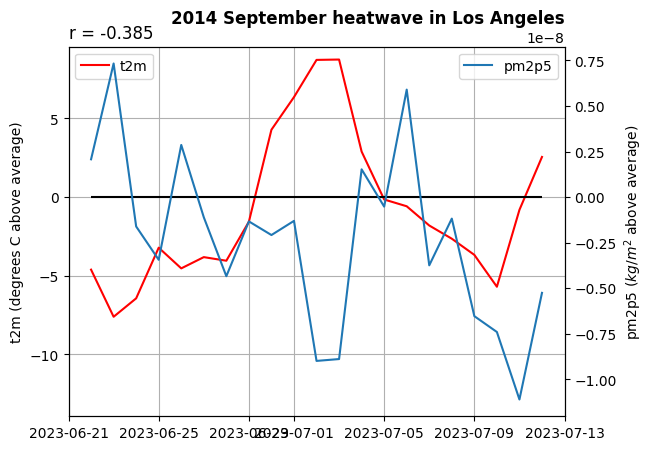

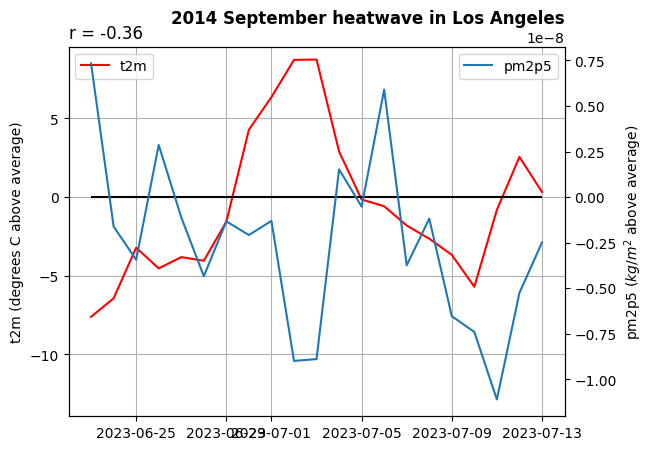

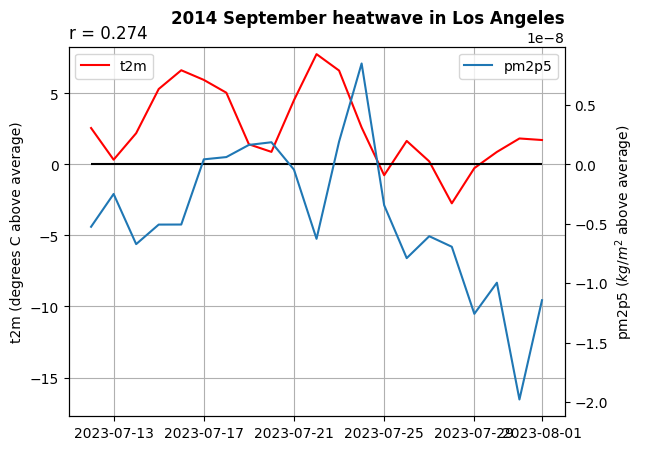

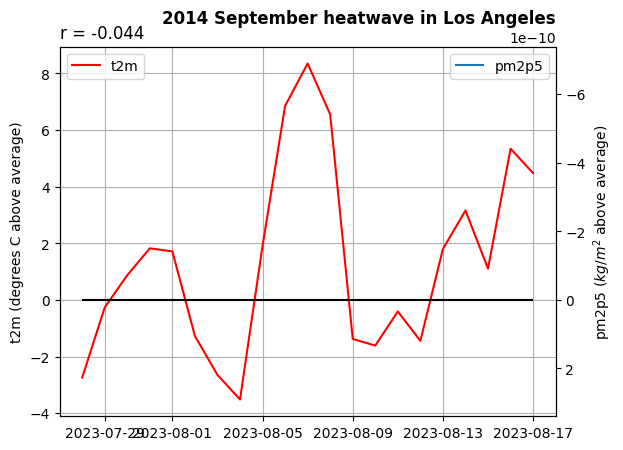

In [ ]:
def time_series():
  i = 1

  for base_date in heat_times:
    print(i)

    pollution = 'pm2p5'
    pollution_label = rf'{pollution} ($kg/m^2$ above average)'

    # Create an array of dates 10 days before and 10 days after
    date_range = np.arange(base_date - np.timedelta64(10, 'D'), base_date + np.timedelta64(11, 'D'), dtype='datetime64[D]')

    ds_anoms_t2m = calculate_anomalies(ds['t2m']).to_dataset()
    ds_anoms_pollution = calculate_anomalies(ds[pollution]).to_dataset()

    time_series_heatwave = ds_anoms_t2m['t2m'].sel(time=date_range, latitude=latitude, longitude=longitude, method='nearest').values
    time_series_pollution = ds_anoms_pollution[pollution].sel(time=date_range, latitude=latitude, longitude=longitude, method='nearest').values

    print(time_series_heatwave)
    print(time_series_pollution)
    reg = linregress(time_series_heatwave, time_series_pollution)
    print(reg)


    fig,ax = plt.subplots()
    ax.plot(date_range, time_series_heatwave, color='Red', label='t2m')
    ax.legend(loc='upper left')
    ax2 = ax.twinx()
    ax2.plot(date_range, time_series_pollution, label=pollution)
    ax2.legend(loc='upper right')
    ax.grid()
    ax.set_ylabel('t2m (degrees C above average)')
    ax2.set_ylabel(pollution_label)
    ax.set_title(f'r = {np.around(reg.rvalue, 3)}', loc='left')
    ax2.set_title('2014 September heatwave in Los Angeles', loc='right', fontweight='bold')

    ax1_yratio = ax.axes.get_ylim()[0]/ ax.axes.get_ylim()[1]


    ax2_yratio = ax2.axes.get_ylim()[0] / ax2.axes.get_ylim()[1]

    if ax1_yratio < ax2_yratio:
      ax2.set_ylim(bottom = ax2.axes.get_ylim()[1]*ax1_yratio)
    else:
      ax.set_ylim(bottom = ax.axes.get_ylim()[1]*ax2_yratio)

    ax.hlines(0,date_range[0],date_range[-1],color='black', linestyle = 'solid')


    i+=1


time_series()

LinregressResult(slope=9.92031002973616, intercept=-30.980921210580213, rvalue=0.22018132960127912, pvalue=0.3375316844404235, stderr=10.082702582534413, intercept_stderr=30.148855148169094)


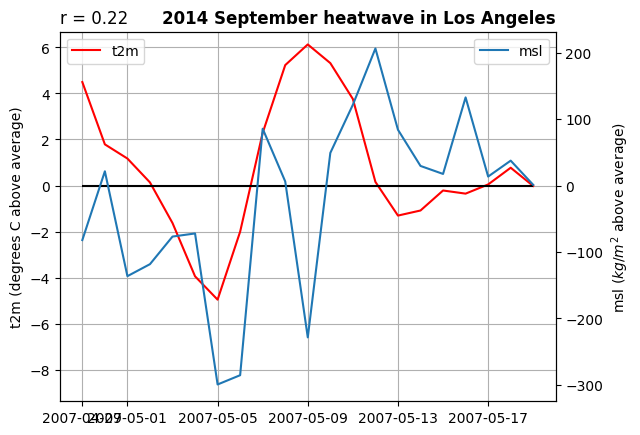

In [ ]:
base_date = heat_times[10]

#pollution = 'pm2p5'
pollution = 'msl'
pollution_label = rf'{pollution} ($kg/m^2$ above average)'

# Create an array of dates 10 days before and 10 days after
date_range = np.arange(base_date - np.timedelta64(10, 'D'), base_date + np.timedelta64(11, 'D'), dtype='datetime64[D]')

ds_anoms_t2m = calculate_anomalies(ds['t2m']).to_dataset()
ds_anoms_pollution = calculate_anomalies(ds[pollution]).to_dataset()

time_series_heatwave = ds_anoms_t2m['t2m'].sel(time=date_range, latitude=latitude, longitude=longitude, method='nearest').values
time_series_pollution = ds_anoms_pollution[pollution].sel(time=date_range, latitude=latitude, longitude=longitude, method='nearest').values

reg = linregress(time_series_heatwave, time_series_pollution)
print(reg)


fig,ax = plt.subplots()
ax.plot(date_range, time_series_heatwave, color='Red', label='t2m')
ax.legend(loc='upper left')
ax2 = ax.twinx()
ax2.plot(date_range, time_series_pollution, label=pollution)
ax2.legend(loc='upper right')
ax.grid()
ax.set_ylabel('t2m (degrees C above average)')
ax2.set_ylabel(pollution_label)
ax.set_title(f'r = {np.around(reg.rvalue, 3)}', loc='left')
ax2.set_title('2014 September heatwave in Los Angeles', loc='right', fontweight='bold')





ax1_yratio = ax.axes.get_ylim()[0]/ ax.axes.get_ylim()[1]

# Find y-axis limits set by the plotter
ax2_yratio = ax2.axes.get_ylim()[0] / ax2.axes.get_ylim()[1]

if ax1_yratio < ax2_yratio:
  ax2.set_ylim(bottom = ax2.axes.get_ylim()[1]*ax1_yratio)
else:
  ax.set_ylim(bottom = ax.axes.get_ylim()[1]*ax2_yratio)


ax.hlines(0,date_range[0],date_range[-1],color='black', linestyle = 'solid')





#plt.grid()
#plt.ylabel('t2m (degress C above average)')
#plt.hlines([0], xmin=date_range[0], xmax=date_range[-1], colors='black')
#plt.title(f'July Heatwave 2003 in {city}')


Text(0.5, 1.0, 'July Heatwave 2003 in Sacramento')

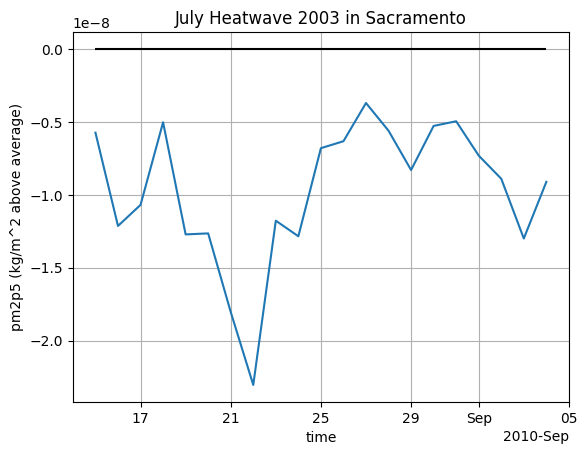

In [ ]:
ds_anoms_pm2p5 = calculate_anomalies(ds['pm2p5']).to_dataset()

ds_anoms_pm2p5['pm2p5'].sel(time=date_range, latitude=latitude, longitude=longitude, method='nearest').plot()

plt.grid()
plt.ylabel('pm2p5 (kg/m^2 above average)')
plt.hlines([0], xmin=date_range[0], xmax=date_range[-1], colors='black')
plt.title(f'July Heatwave 2003 in {city}')

#Fires included (dry vs humid heat)
This includes heat waves and humid waves including fires

In [ ]:
ds

<xarray.Dataset> Size: 132MB
Dimensions:    (longitude: 14, latitude: 14, time: 7669)
Coordinates:
  * longitude  (longitude) float32 56B -124.0 -123.2 -122.5 ... -115.0 -114.2
  * latitude   (latitude) float32 56B 41.75 41.0 40.25 39.5 ... 33.5 32.75 32.0
  * time       (time) datetime64[ns] 61kB 2003-01-01 2003-01-02 ... 2023-12-30
Data variables:
    u10        (time, latitude, longitude) float64 12MB 1.46 1.114 ... -0.4466
    v10        (time, latitude, longitude) float64 12MB 3.406 1.864 ... -2.046
    t2m        (time, latitude, longitude) float64 12MB ...
    msl        (time, latitude, longitude) float64 12MB ...
    pm2p5      (time, latitude, longitude) float64 12MB ...
    tcco       (time, latitude, longitude) float64 12MB ...
    tc_ch4     (time, latitude, longitude) float64 12MB ...
    tcno2      (time, latitude, longitude) float64 12MB ...
    gtco3      (time, latitude, longitude) float64 12MB ...
    tcwv       (time, latitude, longitude) float64 12MB ...
    ws10       (time, latitude, longitude) float64 12MB 3.706 2.171 ... 2.094
Attributes:
    Conventions:  CF-1.6
    history:      2024-08-13 16:19:08 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

In [ ]:
t2m_hot_fires, t2m_humid_fires, t2m_diff_fires = get_composites(heat_times, tcwv_times, var='t2m')
u10_hot_fires, u10_humid_fires, u10_diff_fires = get_composites(heat_times, tcwv_times, var='u10')
v10_hot_fires, v10_humid_fires, v10_diff_fires = get_composites(heat_times, tcwv_times, var='v10')
msl_hot_fires, msl_humid_fires, msl_diff_fires = get_composites(heat_times, tcwv_times, var='msl')
pm2p5_hot_fires, pm2p5_humid_fires, pm2p5_diff_fires = get_composites(heat_times, tcwv_times, var='pm2p5')
tcco_hot_fires, tcco_humid_fires, tcco_diff_fires = get_composites(heat_times, tcwv_times, var='tcco')
tc_ch4_hot_fires, tc_ch4_humid_fires, tc_ch4_diff_fires = get_composites(heat_times, tcwv_times, var='tc_ch4')
tcno2_hot_fires, tcno2_humid_fires, tcno2_diff_fires = get_composites(heat_times, tcwv_times, var='tcno2')
gtco3_hot_fires, gtco3_humid_fires, gtco3_diff_fires = get_composites(heat_times, tcwv_times, var='gtco3')


t2m_hot_la_fires, t2m_humid_la_fires, t2m_diff_la_fires = get_heatwaves(heat_times, tcwv_times, var='pm2p5')

time=np.datetime64("2007-05-09")
heat = t2m_hot_la_fires.sel(time=time, method='nearest')
humid = t2m_humid_la_fires.sel(time=time, method='nearest')

t2m_diff_la_fires
#diff = t2m_diff_la_fires.sel(time=time, method='nearest')


<xarray.DataArray 'pm2p5' (time: 0, latitude: 14, longitude: 14)> Size: 0B
array([], shape=(0, 14, 14), dtype=float64)
Coordinates:
  * longitude  (longitude) float32 56B -124.0 -123.2 -122.5 ... -115.0 -114.2
  * latitude   (latitude) float32 56B 41.75 41.0 40.25 39.5 ... 33.5 32.75 32.0
  * time       (time) datetime64[ns] 0B 
    dayofyear  (time) int64 0B

# Fires excluded (dry vs humid heat)
This includes heat waves and humid waves excluding fires (95th percentile air pollution is removed)

In [ ]:
#selects all of the heat waves without 95th percentile air pollution (removing fires)
heat_no_poll_times = np.setdiff1d(heat_times, polluted_times)




In [ ]:
t2m_hot_nofires, t2m_humid_nofires, t2m_diff_nofires = get_composites(heat_no_poll_times, tcwv_times, var='t2m')
u10_hot_nofires, u10_humid_nofires, u10_diff_nofires = get_composites(heat_no_poll_times, tcwv_times, var='u10')
v10_hot_nofires, v10_humid_nofires, v10_diff_nofires = get_composites(heat_no_poll_times, tcwv_times, var='v10')
msl_hot_nofires, msl_humid_nofires, msl_diff_nofires = get_composites(heat_no_poll_times, tcwv_times, var='msl')
pm2p5_hot_nofires, pm2p5_humid_nofires, pm2p5_diff_nofires = get_composites(heat_no_poll_times, tcwv_times, var='pm2p5')
tcco_hot_nofires, tcco_humid_nofires, tcco_diff_nofires = get_composites(heat_no_poll_times, tcwv_times, var='tcco')
tc_ch4_hot_nofires, tc_ch4_humid_nofires, tc_ch4_diff_nofires = get_composites(heat_no_poll_times, tcwv_times, var='tc_ch4')
tcno2_hot_nofires, tcno2_humid_nofires, tcno2_diff_nofires = get_composites(heat_no_poll_times, tcwv_times, var='tcno2')
gtco3_hot_nofires, gtco3_humid_nofires, gtco3_diff_nofires = get_composites(heat_no_poll_times, tcwv_times, var='gtco3')
#TODO - repeat this for each meteorological variable
#Note to self - If I want the same info, but I don't wanna average over each heat wave, use get_heatwaves (returns lat, lon, time) .sel(time=whatevertime)

t2m_hot_sf_nofires, t2m_humid_sf_nofires, t2m_diff_sf_nofires = get_heatwaves(heat_no_poll_times, tcwv_times, var='t2m')

time=np.datetime64("2003-07-15")
t2m_humid_sf_nofires
heat = t2m_hot_fires.sel(time=time, method='nearest')
humid = t2m_humid_fires.sel(time=time, method='nearest')
diff = t2m_diff_fires.sel(time=time, method='nearest')

NameError: name 'heat_no_poll_times' is not defined

#Scatter Analysis

#Composite Map Analysis (Plotting)

In [ ]:
labelname = 'pm2p5 (kg / m^2 above average)'

##datapoints = [tcno2_hot_nofires,  tcno2_humid_nofires, tcno2_diff_nofires, tcno2_hot_fires, tcno2_humid_fires, tcno2_diff_fires]
#windspeeds_u = [u10_hot_nofires, u10_humid_nofires, u10_diff_nofires, u10_hot_fires, u10_humid_fires, u10_diff_fires]
#windspeeds_v = [v10_hot_nofires, v10_humid_nofires, v10_diff_nofires, v10_hot_fires, v10_humid_fires, v10_diff_fires]
#levels_diff = np.arange(-0.05, 0.052, 0.005)
#levels_norm = np.arange(-0.33, 0.03, 0.015)

#[tcno2_hot_nofires,  tcno2_humid_nofires, tcno2_diff_nofires, tcno2_hot_fires, tcno2_humid_fires, tcno2_diff_fires]
#[pm2p5_hot_nofires, pm2p5_humid_nofires, pm2p5_diff_nofires, pm2p5_hot_fires, pm2p5_humid_fires, pm2p5_diff_fires]
#[tcco_hot_nofires, tcco_humid_nofires, tcco_diff_nofires, tcco_hot_fires, tcco_humid_fires, tcco_diff_fires]
#[gtco3_hot_nofires, gtco3_humid_nofires, gtco3_diff_nofires, gtco3_hot_fires, gtco3_humid_fires, gtco3_diff_fires]



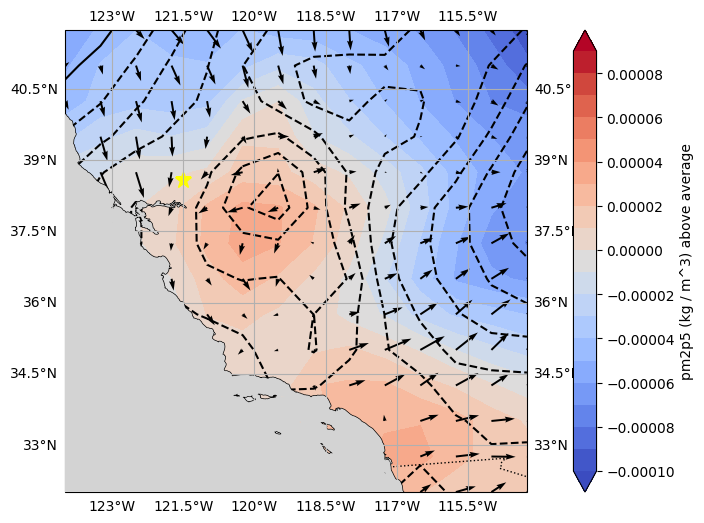

In [ ]:
plot_map(
    datapoint=gtco3_diff_fires,
    label='pm2p5 (kg / m^3) above average',
    save_name = 'temp.png',
    winds={"U10": u10_diff_fires, "V10": v10_diff_fires},
    psl=msl_diff_fires,
    cmap="coolwarm",
    coa=(latitude, longitude),
    levels=np.arange(-10e-5, 10e-5, 1e-5)
)